# Import modules

In [1]:
import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy.external as sce
import anndata

In [2]:
import session_info
session_info.show()

In [11]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120, color_map='RdPu')

# Read in data

In [4]:
adata = sc.read_h5ad('/home/jovyan/mount/gdrive/Colab/data/scVI/RNA_adult_full_raw_AVN-avCM_post-scVI.h5ad')
adata

AnnData object with n_obs × n_vars = 15618 × 26624
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original', 'n_cells'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'X_scArches', 'X_scVI', '_scvi_extra_continuous_covs'

In [5]:
adata.obs['batch_key'].value_counts()

A61_Nuclei_Multiome-v1     11241
AV13_Nuclei_Multiome-v1     2718
AH2_Nuclei_Multiome-v1      1636
AH1_Nuclei_Multiome-v1        23
Name: batch_key, dtype: int64

# Clustering, UMAP

In [6]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.05, spread=0.5, n_components=3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


In [37]:
sc.tl.leiden(adata, resolution=0.99, key_added='leiden_scVI')

running Leiden clustering
    finished: found 21 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:02)


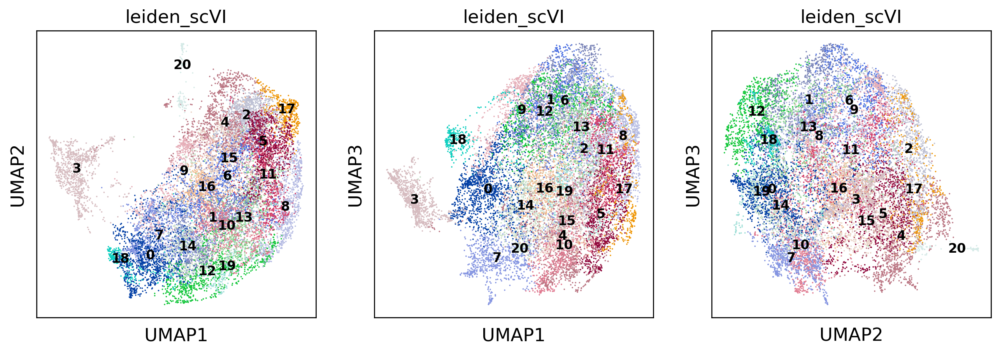

In [38]:
sc.pl.umap(adata, color=['leiden_scVI'], size=5, wspace=0.1, legend_loc='on data', legend_fontsize=10,components='all')

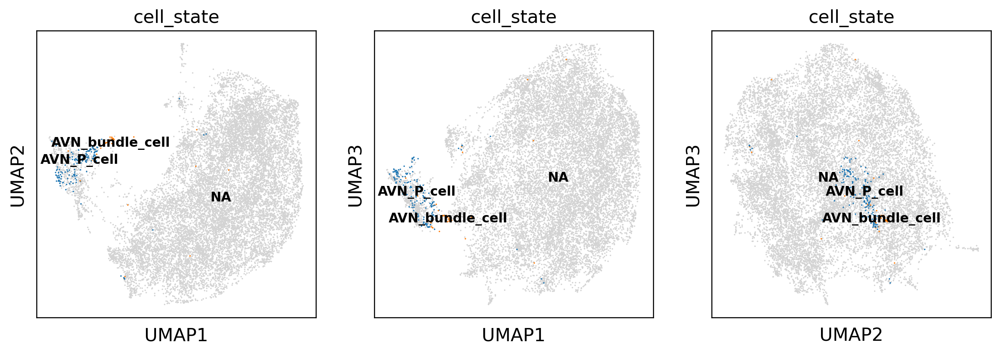

In [32]:
sc.pl.umap(adata, color=['cell_state'], groups=['AVN_P_cell','AVN_bundle_cell'], size=5, wspace=0.1, 
           legend_loc='on data', legend_fontsize=10,components='all')

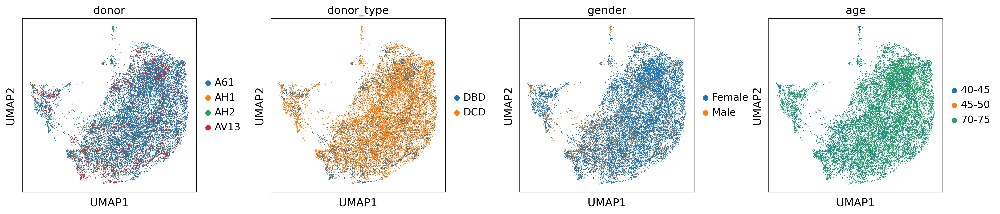

In [33]:
sc.pl.umap(adata, color=['donor','donor_type','gender','age'], size=5, wspace=0.3)

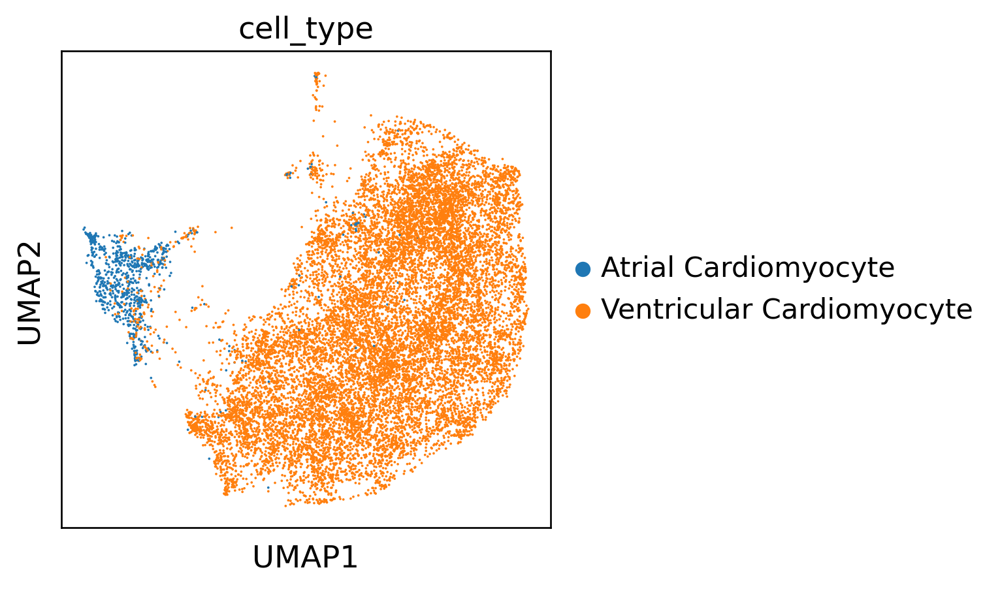

In [34]:
sc.pl.umap(adata, color=['cell_type'], size=5, wspace=0.3)

# Re-annotate Atrial and Ventricle CMs

In [14]:
## set gene name as var_names 
adata.var['gene_id']=adata.var_names.copy()
adata.var.set_index('gene_name-new',inplace=True)
adata.var_names=adata.var_names.astype('str')
adata.var_names_make_unique()

## filter and lognormalised
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


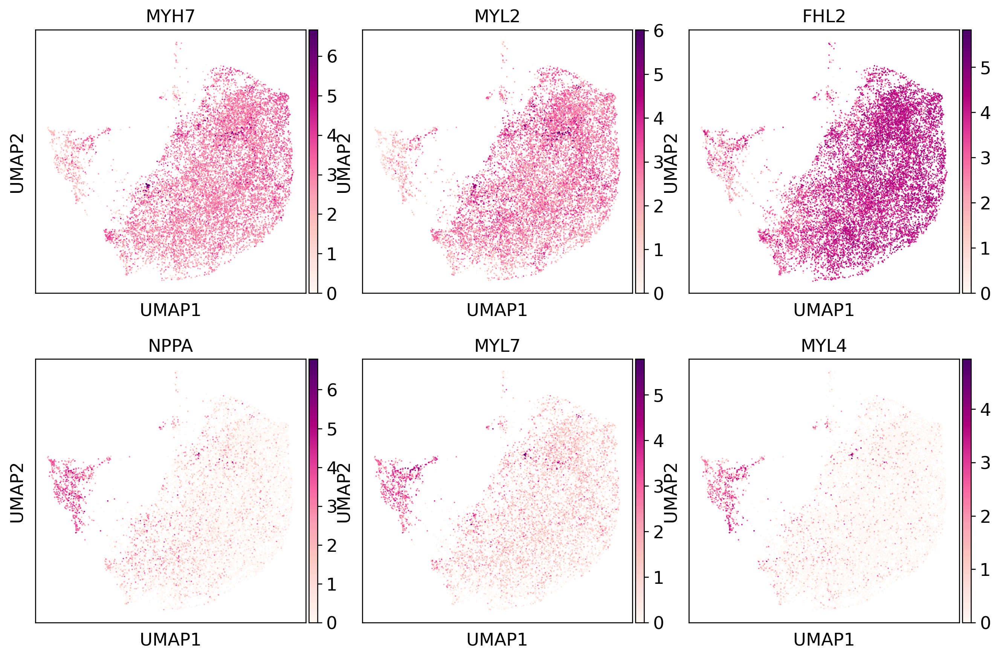

In [24]:
sc.pl.umap(adata, color=['MYH7', 'MYL2', 'FHL2','NPPA', 'MYL7', 'MYL4'], 
           size=5, wspace=0.1, legend_loc='on data', legend_fontsize=10, ncols=3)

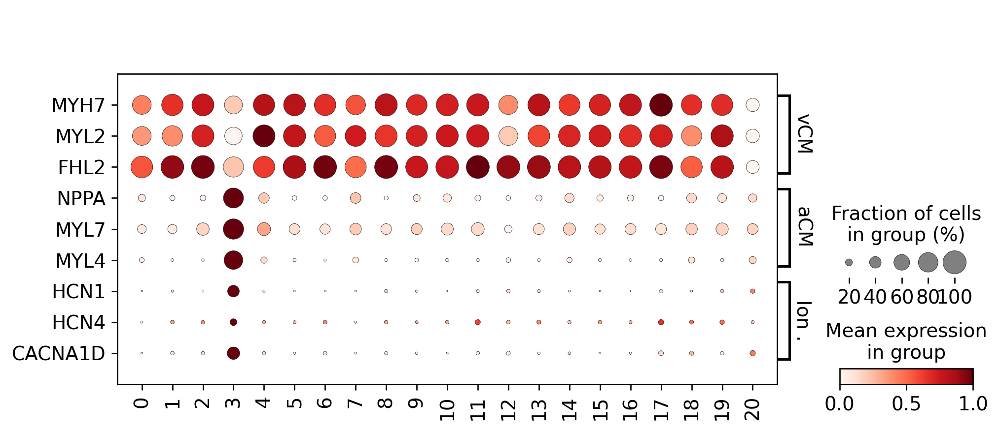

In [40]:
sc.settings.set_figure_params(dpi=120, color_map='RdPu')

markers={
  'vCM': ['MYH7', 'MYL2', 'FHL2'],
  'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Ion channels':['HCN1','HCN4','CACNA1D',], 
   #  'AV bundle cell':['GJA5','CRNDE','CNTN5','SCN5A'],
}

# cell adhesion protein on the postsynaptic membrane
for k,v in markers.items():
    markers[k]=[x for x in v if x in adata.var_names]

sc.pl.dotplot(adata, 
              markers, 
              groupby='leiden_scVI',
              dendrogram=False,
             # use_raw=True,
              standard_scale="var",
              color_map="Reds",
             swap_axes=True,
             # title='Neurexin receptors'
             )

In [ ]:
# reannotate
adata.obs['AVN_pre_cell_type']=adata.obs['cell_type'].copy()
adata.obs['cell_type']=adata.obs['cell_type'].astype('str')
adata.obs['cell_type']='Ventricular Cardiomyocyte'
aCM_index = adata.obs_names[adata.obs['leiden_scVI']=='3']
adata.obs.loc[aCM_index,'cell_type'] = 'Atrial Cardiomyocyte'

adata.obs['cell_type'].value_counts()

In [ ]:
pd.crosstab(adata.obs['cell_type'], adata.obs['AVN_pre_cell_type'])

In [ ]:
# save
# adata.write('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-avCM_lognorm_umap.h5ad')

# Subset aCM and annotate CCS cells

In [44]:
adata = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-avCM_lognorm_umap.h5ad')
adata

AnnData object with n_obs × n_vars = 15618 × 26624
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'AVN_pre_cell_type', 'CCS_or_others'
    var: 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original', 'n_cells', 'gene_id'
    uns: 'CCS_or_others_colors', '_scvi_manager_uuid', '_scvi_uuid', 'age_colors', 'cell_s

In [45]:
adata_acm = adata[adata.obs['cell_type']=='Atrial Cardiomyocyte']
adata_acm

View of AnnData object with n_obs × n_vars = 955 × 26624
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'AVN_pre_cell_type', 'CCS_or_others'
    var: 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original', 'n_cells', 'gene_id'
    uns: 'CCS_or_others_colors', '_scvi_manager_uuid', '_scvi_uuid', 'age_colors', '

In [73]:
sc.pp.neighbors(adata_acm, use_rep="X_scVI", n_neighbors=10)
sc.tl.umap(adata_acm, min_dist=0.3, spread=0.5, n_components=3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [47]:
sc.tl.leiden(adata_acm, resolution=0.8, key_added='leiden_scVI')

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)


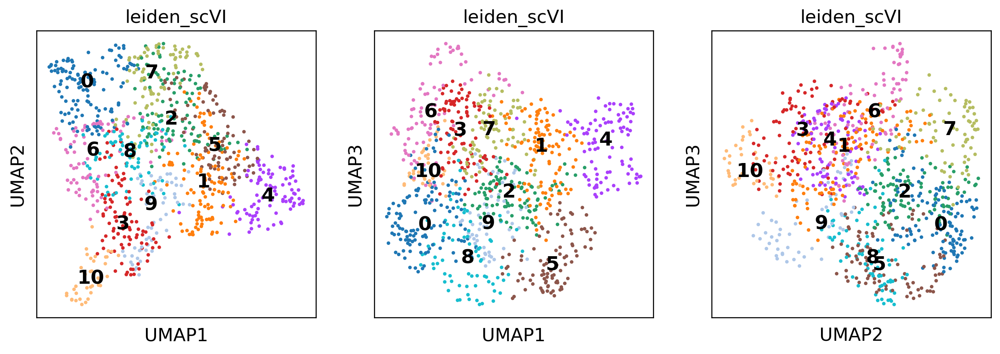

In [74]:
sc.pl.umap(adata_acm, color=['leiden_scVI'], size=30, wspace=0.1, legend_loc='on data', legend_fontsize=15,components='all')

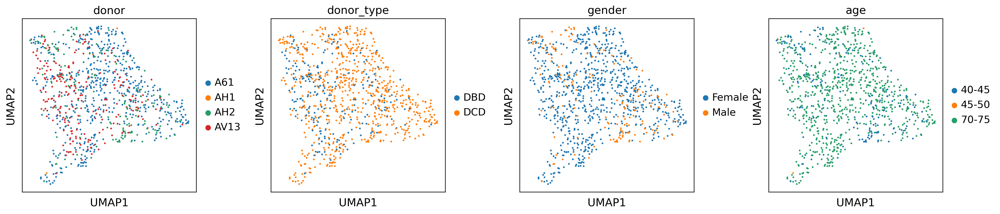

In [75]:
sc.pl.umap(adata_acm, color=['donor','donor_type','gender','age'], size=20, wspace=0.3,ncols=5)

categories: 0, 1, 2, etc.
var_group_labels: Ion channels, AV bundle cell, TFs


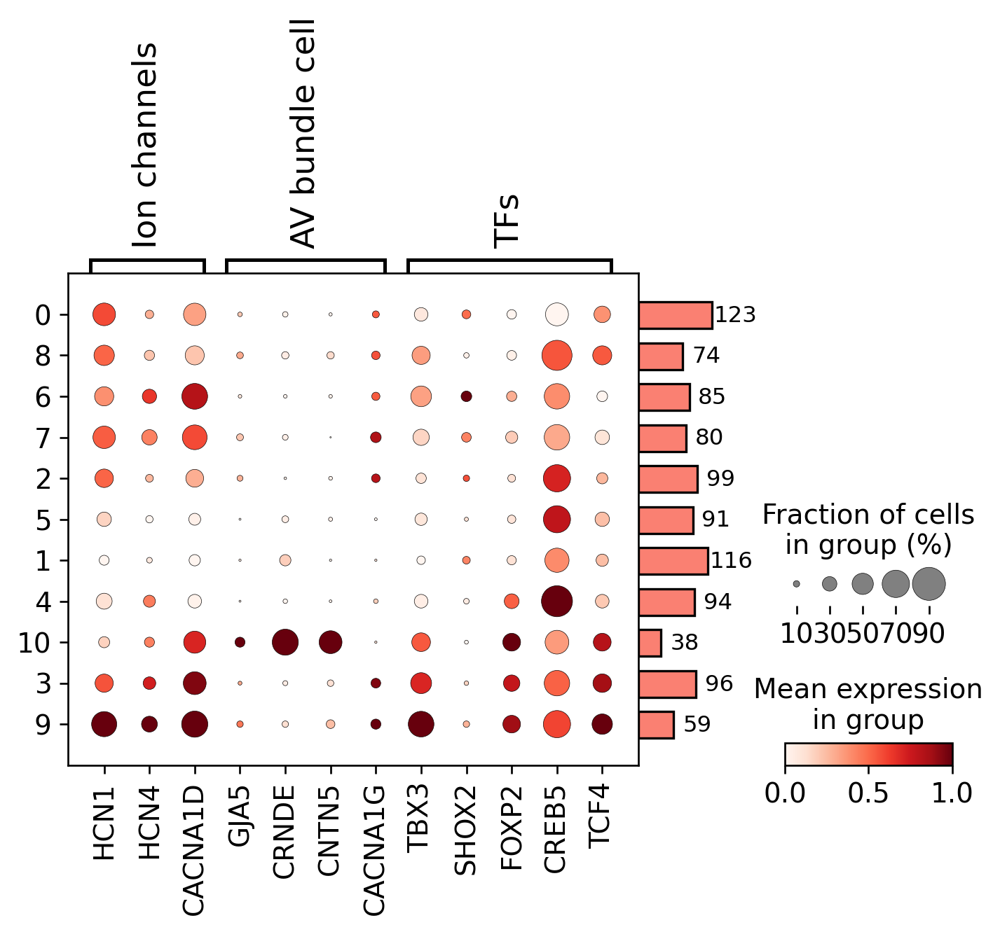

In [79]:
sc.settings.set_figure_params(dpi=120, color_map='RdPu')

markers={
    'Ion channels':['HCN1','HCN4','CACNA1D',], 
    'AV bundle cell':['GJA5','CRNDE','CNTN5','CACNA1G'],# 'CACNA2D1',
    # 'GPCRs':['CHRM2','ADRB1','GLP1R','AGTR1'],
    # 'Glutamate signaling':['GRIA3','GLS','SLC1A3','SLC17A5'],
    'TFs':['TBX3','SHOX2','FOXP2','CREB5','TCF4'],
    # 'Post-synaptic':['NLGN1','LRRTM3','ADGRL1']
}

# cell adhesion protein on the postsynaptic membrane
for k,v in markers.items():
    markers[k]=[x for x in v if x in adata_acm.var_names]

dp=sc.pl.dotplot(adata_acm, 
              markers, 
              groupby='leiden_scVI',
              dendrogram=True,
             # use_raw=True,
              standard_scale="var",
              color_map="Reds",
             swap_axes=False,
            return_fig=True
             # title='Neurexin receptors'
             )
dp.add_totals().show()

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  del sys.path[0]


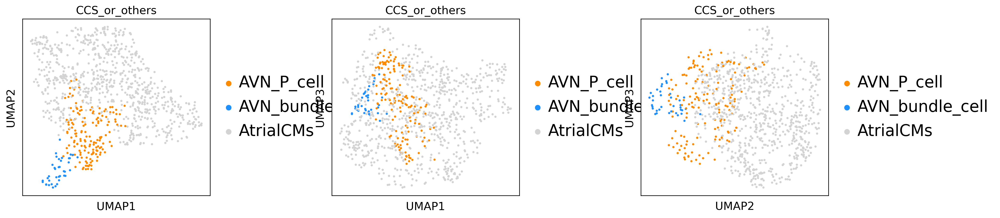

In [81]:
# annotate
Pcell_cluster = ['3','9']
Bundle_cluster = ['10']

adata_acm.obs['CCS_or_others'] = 'AtrialCMs'
adata_acm.obs.loc[adata_acm.obs_names[adata_acm.obs['leiden_scVI'].isin(Pcell_cluster)],'CCS_or_others'] = 'AVN_P_cell'
adata_acm.obs.loc[adata_acm.obs_names[adata_acm.obs['leiden_scVI'].isin(Bundle_cluster)],'CCS_or_others'] = 'AVN_bundle_cell'

adata_acm.obs['CCS_or_others']=adata_acm.obs['CCS_or_others'].astype('category')
adata_acm.obs['CCS_or_others'].cat.reorder_categories([
   'AVN_P_cell',
    'AVN_bundle_cell',
    'AtrialCMs'
     ], inplace=True)

sc.pl.umap(adata_acm, color=['CCS_or_others'], size=30, wspace=0.5, legend_fontsize=20, components='all')

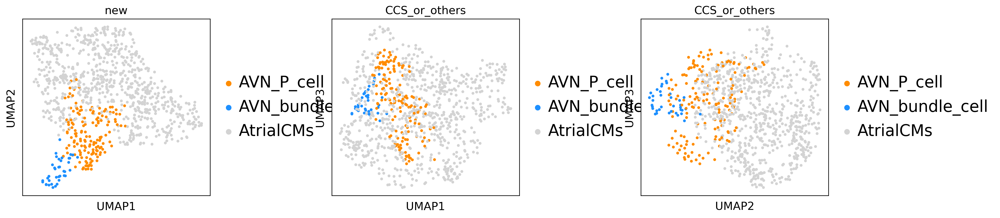

In [82]:
adata_acm.uns["CCS_or_others_colors"][list(adata_acm.obs['CCS_or_others'].cat.categories).index('AVN_P_cell')]='darkorange'
adata_acm.uns["CCS_or_others_colors"][list(adata_acm.obs['CCS_or_others'].cat.categories).index('AVN_bundle_cell')]='dodgerblue'
adata_acm.uns["CCS_or_others_colors"][list(adata_acm.obs['CCS_or_others'].cat.categories).index('AtrialCMs')]='lightgrey'

sc.pl.umap(adata_acm, color=['CCS_or_others'], size=50, wspace=0.5, legend_fontsize=20, title='new', components='all')

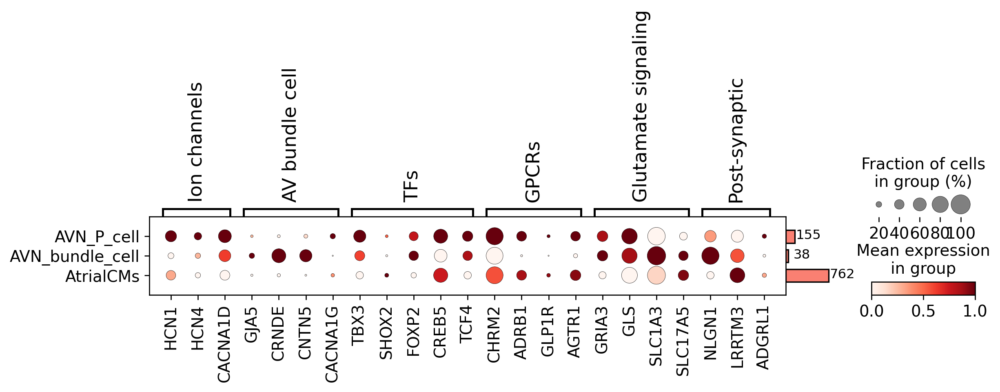

In [83]:
sc.settings.set_figure_params(dpi=120, color_map='RdPu')

markers={
    'Ion channels':['HCN1','HCN4','CACNA1D',], 
    'AV bundle cell':['GJA5','CRNDE','CNTN5','CACNA1G'],# 'CACNA2D1',
    'TFs':['TBX3','SHOX2','FOXP2','CREB5','TCF4'],
    'GPCRs':['CHRM2','ADRB1','GLP1R','AGTR1'],
    'Glutamate signaling':['GRIA3','GLS','SLC1A3','SLC17A5'],
    'Post-synaptic':['NLGN1','LRRTM3','ADGRL1']
}

# cell adhesion protein on the postsynaptic membrane
for k,v in markers.items():
    markers[k]=[x for x in v if x in adata_acm.var_names]

dp=sc.pl.dotplot(adata_acm, 
              markers, 
              groupby='CCS_or_others',
              dendrogram=False,
             # use_raw=True,
              standard_scale="var",
              color_map="Reds",
             swap_axes=False,
            return_fig=True
             # title='Neurexin receptors'
             )
dp.add_totals().show()

In [86]:
adata_acm.X.data[:10]

array([1.8500239 , 1.3029088 , 1.2344099 , 0.99526656, 3.213913  ,
       1.4840766 , 1.3670148 , 1.2344099 , 0.79668486, 0.99526656],
      dtype=float32)

In [87]:
# save object
adata_acm.write('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-atrialCM_lognorm_umap.h5ad')

# Add labels to original adata

In [37]:
adata.X.data[:10]

array([0.66752017, 2.13262   , 0.8179556 , 0.94869155, 2.0132413 ,
       1.0642948 , 1.0642948 , 0.7455641 , 0.27495065, 2.9040215 ],
      dtype=float32)

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  # Remove the CWD from sys.path while we load stuff.


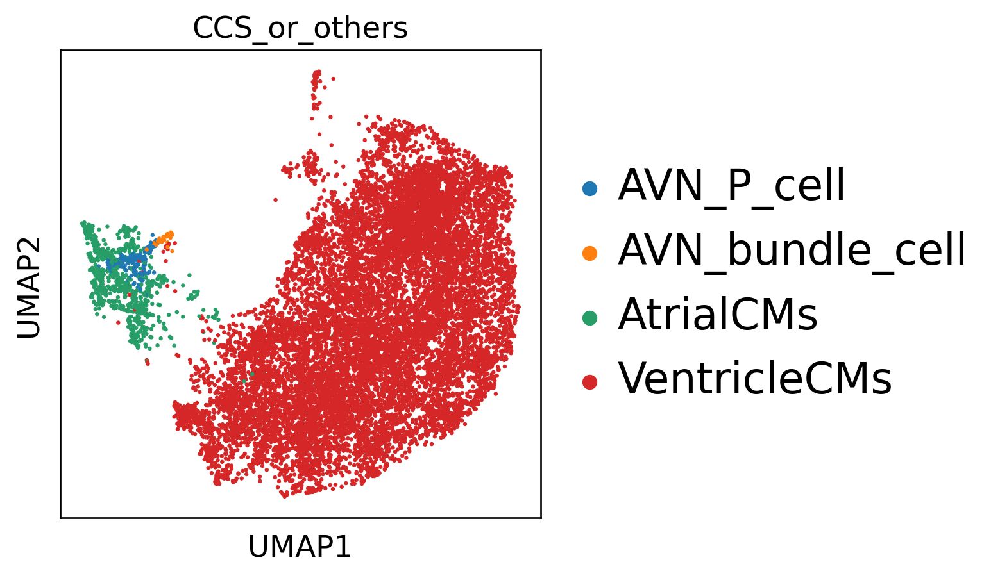

In [65]:
adata.obs['CCS_or_others'] = 'VentricleCMs'
adata.obs.loc[adata_acm.obs_names,'CCS_or_others'] = adata_acm.obs['CCS_or_others'].copy()

adata.obs['CCS_or_others']=adata.obs['CCS_or_others'].astype('category')
adata.obs['CCS_or_others'].cat.reorder_categories([
   'AVN_P_cell',
    'AVN_bundle_cell',
    'AtrialCMs',
    'VentricleCMs'
     ], inplace=True)

sc.pl.umap(adata, color=['CCS_or_others'], size=15, wspace=0.5, legend_fontsize=20)

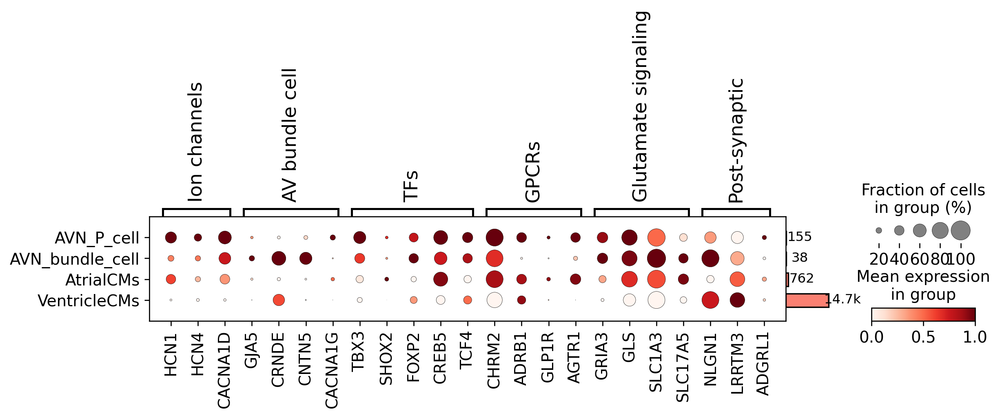

In [43]:
sc.settings.set_figure_params(dpi=120, color_map='RdPu')

markers={
    'Ion channels':['HCN1','HCN4','CACNA1D',], 
    'AV bundle cell':['GJA5','CRNDE','CNTN5','CACNA1G'],# 'CACNA2D1',
    'TFs':['TBX3','SHOX2','FOXP2','CREB5','TCF4'],
    'GPCRs':['CHRM2','ADRB1','GLP1R','AGTR1'],
    'Glutamate signaling':['GRIA3','GLS','SLC1A3','SLC17A5'],
    'Post-synaptic':['NLGN1','LRRTM3','ADGRL1']
}

# cell adhesion protein on the postsynaptic membrane
for k,v in markers.items():
    markers[k]=[x for x in v if x in adata.var_names]

dp=sc.pl.dotplot(adata, 
              markers, 
              groupby='CCS_or_others',
              dendrogram=False,
             # use_raw=True,
              standard_scale="var",
              color_map="Reds",
             swap_axes=False,
            return_fig=True
             # title='Neurexin receptors'
             )
dp.add_totals().show()

# Save

In [66]:
adata.write('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-avCM_lognorm_umap.h5ad')

In [67]:
# get index of CCS cells
P_index = adata.obs_names[adata.obs['CCS_or_others']=='AVN_P_cell']
P_index.to_series().to_csv('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-P_index.csv',index=False)

bundle_index = adata.obs_names[adata.obs['CCS_or_others']=='AVN_bundle_cell']
bundle_index.to_series().to_csv('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-bundle_index.csv',index=False)

In [68]:
# updated cell type labels
adata.obs[['cell_type']].to_csv('/nfs/team205/heart/anndata_objects/8regions/CCS_annotations_full/AVN-CMs_celltype_labels.csv',index=True)

In [70]:
adata.obs['cell_type'].value_counts()

Ventricular Cardiomyocyte    14663
Atrial Cardiomyocyte           955
Name: cell_type, dtype: int64

# Proportion

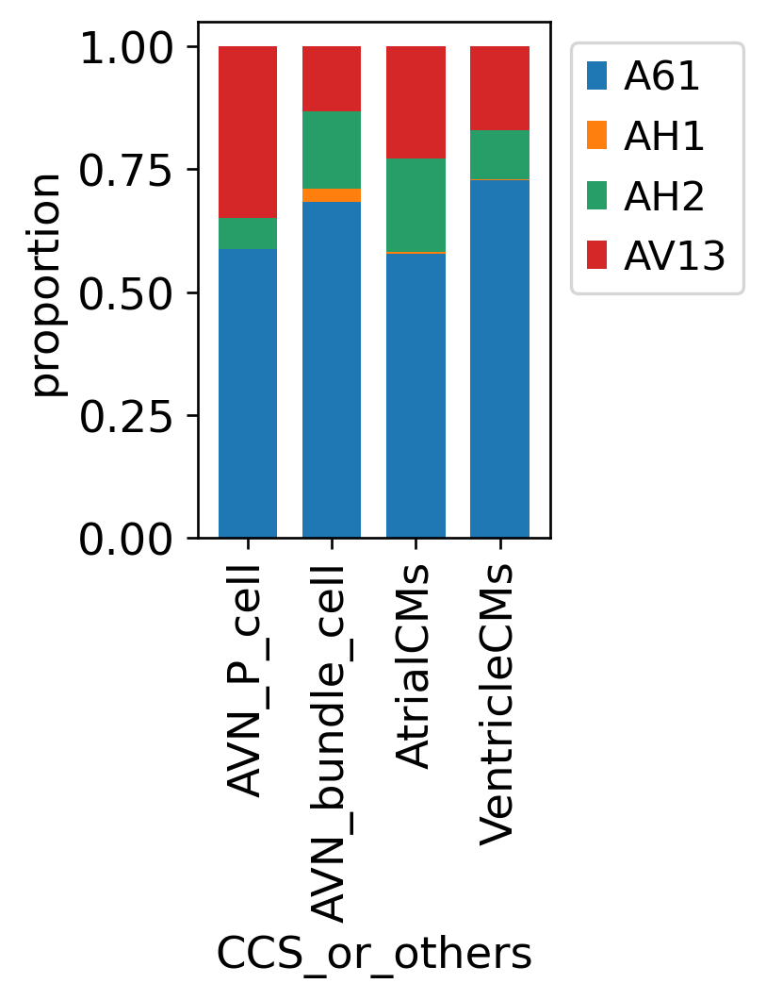

In [88]:
plt.rcParams['figure.figsize'] = 2,3
tmp = pd.crosstab(adata.obs['CCS_or_others'], adata.obs['donor'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True,width=0.7)
ax.grid(False)
ax.set_ylabel('proportion')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()
plt.show()